<a href="https://colab.research.google.com/github/GKS07/Computer_Vision/blob/main/Animals_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Importing the libraries**

In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
import matplotlib.image as mpimg
%matplotlib inline
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout,Flatten, Dense, Rescaling
from tensorflow.keras.activations import relu, sigmoid
import seaborn as sns
import keras
from tensorflow.keras.applications import VGG19


import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

**Downloading the data**

In [2]:
# uploading the kaggle jason file
from google.colab import files
files.upload()

# copying the kaggle file

!mkdir ~/.kaggle # nmaking the folder

! cp kaggle.json ~/.kaggle/  #copy the file

#changing the permission.
! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [3]:
!kaggle datasets download -d iamsouravbanerjee/animal-image-dataset-90-different-animals

# making the folder
!mkdir Animals


100% 656M/656M [00:07<00:00, 111MB/s]
100% 656M/656M [00:07<00:00, 95.6MB/s]


In [4]:
!unzip animal-image-dataset-90-different-animals.zip -d Animals

Streaming output truncated to the last 5000 lines.
  inflating: Animals/animals/animals/bison/73b10839bc.jpg  
  inflating: Animals/animals/animals/bison/74dc1dd32a.jpg  
  inflating: Animals/animals/animals/bison/75ab166a7d.jpg  
  inflating: Animals/animals/animals/bison/79e1610d01.jpg  
  inflating: Animals/animals/animals/bison/7ba5eee91f.jpg  
  inflating: Animals/animals/animals/bison/7d214aab4b.jpg  
  inflating: Animals/animals/animals/bison/7f2ef9ab03.jpg  
  inflating: Animals/animals/animals/bison/82ec723a4f.jpg  
  inflating: Animals/animals/animals/bison/85e145af6c.jpg  
  inflating: Animals/animals/animals/bison/862e2c6379.jpg  
  inflating: Animals/animals/animals/bison/87a5c700ad.jpg  
  inflating: Animals/animals/animals/bison/88b723ce90.jpg  
  inflating: Animals/animals/animals/bison/8c3af742c3.jpg  
  inflating: Animals/animals/animals/bison/8e34044b98.jpg  
  inflating: Animals/animals/animals/bison/8e6adbdc40.jpg  
  inflating: Animals/animals/animals/bison/8fce80

# Loading and Preprocessing the images

In [5]:
training_path = '/content/Animals/animals/animals'

In [6]:
for sub_dir in os.listdir(training_path):
    img_file = os.listdir(os.path.join(training_path,sub_dir))
    print("The number of",sub_dir,"is:", len(img_file))

The number of mosquito is: 60
The number of crab is: 60
The number of duck is: 60
The number of rat is: 60
The number of porcupine is: 60
The number of crow is: 60
The number of gorilla is: 60
The number of penguin is: 60
The number of sparrow is: 60
The number of cockroach is: 60
The number of lizard is: 60
The number of seahorse is: 60
The number of sandpiper is: 60
The number of flamingo is: 60
The number of hornbill is: 60
The number of kangaroo is: 60
The number of elephant is: 60
The number of caterpillar is: 60
The number of woodpecker is: 60
The number of beetle is: 60
The number of owl is: 60
The number of goldfish is: 60
The number of turkey is: 60
The number of swan is: 60
The number of parrot is: 60
The number of fly is: 60
The number of hippopotamus is: 60
The number of okapi is: 60
The number of cow is: 60
The number of orangutan is: 60
The number of bee is: 60
The number of goose is: 60
The number of tiger is: 60
The number of moth is: 60
The number of ladybugs is: 60
Th

90 classes:
['antelope', 'badger', 'bat', 'bear', 'bee', 'beetle', 'bison', 'boar', 'butterfly', 'cat', 'caterpillar', 'chimpanzee', 'cockroach', 'cow', 'coyote', 'crab', 'crow', 'deer', 'dog', 'dolphin', 'donkey', 'dragonfly', 'duck', 'eagle', 'elephant', 'flamingo', 'fly', 'fox', 'goat', 'goldfish', 'goose', 'gorilla', 'grasshopper', 'hamster', 'hare', 'hedgehog', 'hippopotamus', 'hornbill', 'horse', 'hummingbird', 'hyena', 'jellyfish', 'kangaroo', 'koala', 'ladybugs', 'leopard', 'lion', 'lizard', 'lobster', 'mosquito', 'moth', 'mouse', 'octopus', 'okapi', 'orangutan', 'otter', 'owl', 'ox', 'oyster', 'panda', 'parrot', 'pelecaniformes', 'penguin', 'pig', 'pigeon', 'porcupine', 'possum', 'raccoon', 'rat', 'reindeer', 'rhinoceros', 'sandpiper', 'seahorse', 'seal', 'shark', 'sheep', 'snake', 'sparrow', 'squid', 'squirrel', 'starfish', 'swan', 'tiger', 'turkey', 'turtle', 'whale', 'wolf', 'wombat', 'woodpecker', 'zebra']


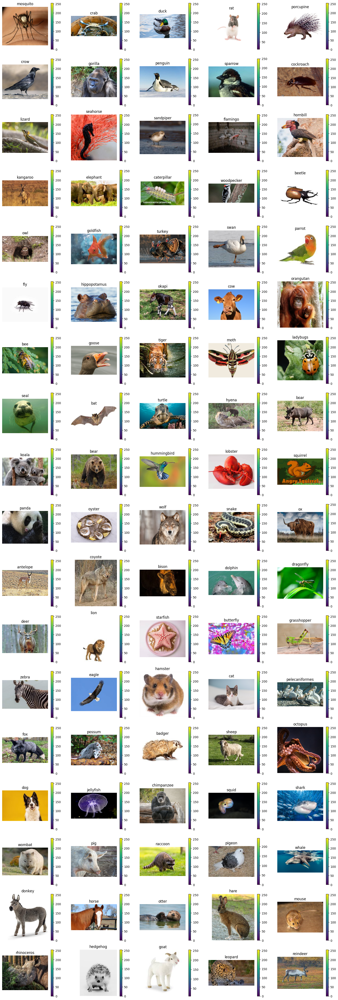

In [7]:
# plotting the one image from each folder
classes = os.listdir(training_path)
classes.sort()
print(len(classes), 'classes:')
print(classes)

# Show the first image in each folder
fig = plt.figure(figsize=(20, 60))
i = 0
for sub_dir in os.listdir(training_path):
    i+=1
    img_file = os.listdir(os.path.join(training_path,sub_dir))[0]
    img_path = os.path.join(training_path, sub_dir, img_file)
    img = mpimg.imread(img_path)
    a=fig.add_subplot(18, 5,i)
    a.axis('off')
    imgplot = plt.imshow(img)
    a.set_title(sub_dir)
    plt.colorbar()
plt.show()

In [8]:
path = "/content/Animals/animals/animals"


data = {"imgpath": [] , "labels": [] }

category = os.listdir(path)
for folder in category:
    folderpath = os.path.join(path , folder)
    filelist = os.listdir(folderpath)
    for file in filelist:
        fpath = os.path.join(folderpath, file)
        data["imgpath"].append(fpath)
        data["labels"].append(folder)


df = pd.DataFrame(data)

#Convert labels to numbers
lb = LabelEncoder()
df['encoded_labels'] = lb.fit_transform(df['labels'])

In [9]:
train_df, Temp_df = train_test_split(df,  train_size= 0.70 , shuffle=True, random_state=124)
valid_df , test_df = train_test_split(Temp_df ,  train_size= 0.70 , shuffle=True, random_state=124)
train_df = train_df.reset_index(drop=True)
valid_df = valid_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

print("----------Train-------------")
print(train_df[["imgpath", "labels"]].head(5))
print(train_df.shape)
print("--------Validation----------")
print(valid_df[["imgpath", "labels"]].head(5))
print(valid_df.shape)
print("----------Test--------------")
print(test_df[["imgpath", "labels"]].head(5))
print(test_df.shape)

----------Train-------------
                                             imgpath     labels
0  /content/Animals/animals/animals/lion/355a292a...       lion
1  /content/Animals/animals/animals/lizard/7f131e...     lizard
2  /content/Animals/animals/animals/bat/132f45ab1...        bat
3  /content/Animals/animals/animals/porcupine/41f...  porcupine
4  /content/Animals/animals/animals/ladybugs/818f...   ladybugs
(3779, 3)
--------Validation----------
                                             imgpath        labels
0  /content/Animals/animals/animals/hippopotamus/...  hippopotamus
1  /content/Animals/animals/animals/lion/12f57cfa...          lion
2  /content/Animals/animals/animals/wombat/6c3a87...        wombat
3  /content/Animals/animals/animals/cat/354bb2acd...           cat
4  /content/Animals/animals/animals/swan/7e2a4535...          swan
(1134, 3)
----------Test--------------
                                             imgpath   labels
0  /content/Animals/animals/animals/pig/65ac5

In [91]:

BATCH_SIZE = 15
IMAGE_SIZE = (224, 224)


generator = ImageDataGenerator(
    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input
)

# Split the data into three categories.
train_images = generator.flow_from_dataframe(
                                              dataframe=train_df,
                                              x_col='imgpath',
                                              y_col='labels',
                                              target_size=IMAGE_SIZE,
                                              color_mode='rgb',
                                              class_mode='categorical',
                                              batch_size=BATCH_SIZE,
                                              shuffle=True,
                                              seed=42
                                              )

val_images = generator.flow_from_dataframe(
                                            dataframe=valid_df,
                                            x_col='imgpath',
                                            y_col='labels',
                                            target_size=IMAGE_SIZE,
                                            color_mode='rgb',
                                            class_mode='categorical',
                                            batch_size=BATCH_SIZE,
                                            shuffle=False
                                            )

test_images = generator.flow_from_dataframe(
                                            dataframe=test_df,
                                            #rescale = 1./255,
                                            x_col='imgpath',
                                            y_col='labels',
                                            target_size=IMAGE_SIZE,
                                            color_mode='rgb',
                                            class_mode='categorical',
                                            batch_size=BATCH_SIZE,
                                            shuffle=False
                                            )

Found 3779 validated image filenames belonging to 90 classes.
Found 1134 validated image filenames belonging to 90 classes.
Found 487 validated image filenames belonging to 90 classes.


**Training and Validation data**

In [99]:
# Creating a training and validation data.

# defining some parameter

batch_size = 15
img_size = 224

#generating data
img_data_generator = ImageDataGenerator(shear_range = 0.2,
                                        #rescale = 1./255,
                                        zoom_range = 0.2,
                                        horizontal_flip = True,
                                        vertical_flip = True,
                                        width_shift_range = 0.2,
                                        height_shift_range = 0.2,
                                        validation_split = 0.1)


data_generator = ImageDataGenerator(preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,
                                    validation_split = 0.1
                                    )

#generating a training data
training_data = img_data_generator.flow_from_directory(training_path,
                                                       target_size = (img_size, img_size),
                                                       color_mode = 'rgb',
                                                       batch_size = batch_size,
                                                       class_mode = 'categorical',
                                                       subset = 'training')

#generating the validation data

validation_data = data_generator.flow_from_directory(training_path,
                                                         target_size = (img_size, img_size),
                                                         color_mode = 'rgb',
                                                         batch_size = batch_size,
                                                         class_mode = 'categorical',
                                                         subset = 'validation'
                                                         )



Found 4860 images belonging to 90 classes.
Found 540 images belonging to 90 classes.


In [12]:
print("The shape of the training images is :", training_data.image_shape)

The shape of the training images is : (224, 224, 3)


In [13]:
print("The indices of the claasses are:")
training_data.class_indices

The indices of the claasses are:


{'antelope': 0,
 'badger': 1,
 'bat': 2,
 'bear': 3,
 'bee': 4,
 'beetle': 5,
 'bison': 6,
 'boar': 7,
 'butterfly': 8,
 'cat': 9,
 'caterpillar': 10,
 'chimpanzee': 11,
 'cockroach': 12,
 'cow': 13,
 'coyote': 14,
 'crab': 15,
 'crow': 16,
 'deer': 17,
 'dog': 18,
 'dolphin': 19,
 'donkey': 20,
 'dragonfly': 21,
 'duck': 22,
 'eagle': 23,
 'elephant': 24,
 'flamingo': 25,
 'fly': 26,
 'fox': 27,
 'goat': 28,
 'goldfish': 29,
 'goose': 30,
 'gorilla': 31,
 'grasshopper': 32,
 'hamster': 33,
 'hare': 34,
 'hedgehog': 35,
 'hippopotamus': 36,
 'hornbill': 37,
 'horse': 38,
 'hummingbird': 39,
 'hyena': 40,
 'jellyfish': 41,
 'kangaroo': 42,
 'koala': 43,
 'ladybugs': 44,
 'leopard': 45,
 'lion': 46,
 'lizard': 47,
 'lobster': 48,
 'mosquito': 49,
 'moth': 50,
 'mouse': 51,
 'octopus': 52,
 'okapi': 53,
 'orangutan': 54,
 'otter': 55,
 'owl': 56,
 'ox': 57,
 'oyster': 58,
 'panda': 59,
 'parrot': 60,
 'pelecaniformes': 61,
 'penguin': 62,
 'pig': 63,
 'pigeon': 64,
 'porcupine': 65,
 'pos

**Displaying the images from training data**

In [100]:
CLASSES = [x for x in training_data.class_indices]

def display_one_flower(image, title, subplot, color):
  #img = plt.Normalize()
  plt.subplot(subplot)
  plt.axis('off')
  plt.imshow(image*1./255)
  plt.title(title, fontsize=16, color=color)

# plotting the 9 images
def display_nine_flowers(images, titles, title_colors=None):
  subplot = 331
  plt.figure(figsize=(20,15))
  for i in range(9):
    color = 'black' if title_colors is None else title_colors[i]
    display_one_flower(images[i], titles[i], 331+i, color)
  plt.tight_layout()
  plt.subplots_adjust(wspace=0.1, hspace=0.1)
  plt.show()

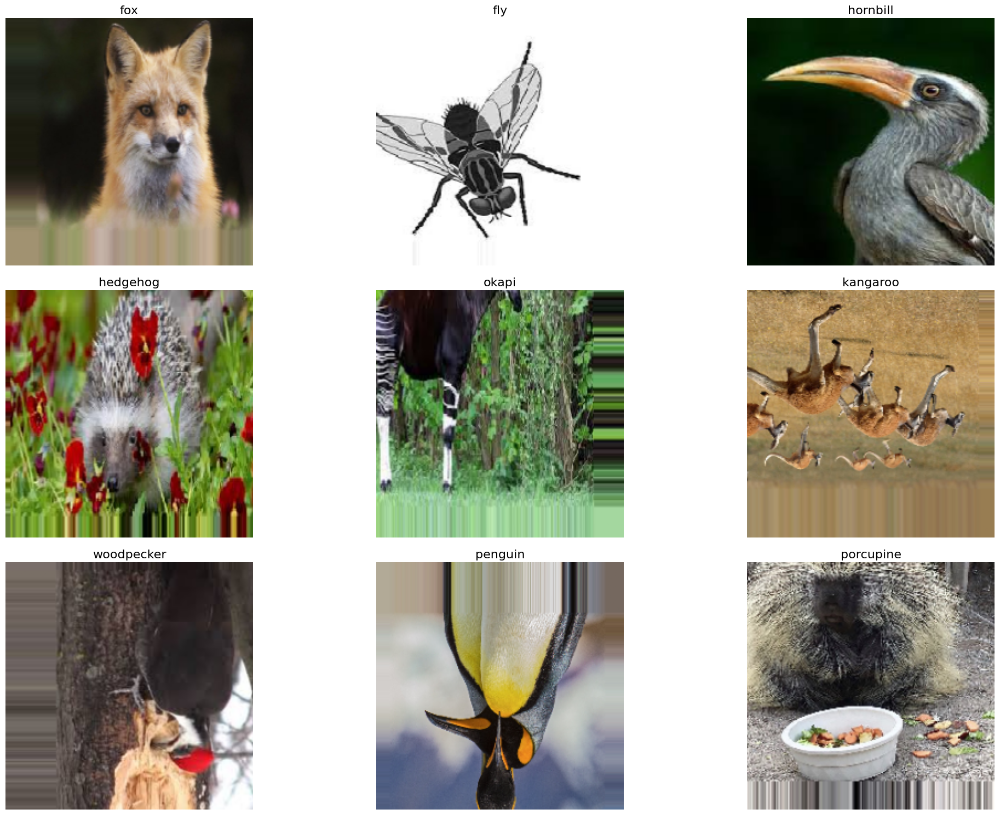

In [101]:
# displaying the 9 training data images.
images, classes = next(training_data)
class_idxs = np.argmax(classes, axis=-1) # transform from one-hot array to class number
labels = [CLASSES[idx] for idx in class_idxs]
display_nine_flowers(images, labels)

# Building a Classifier Model

In [20]:
# Data Augmentation

augment = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal"),
  layers.experimental.preprocessing.RandomRotation(0.15),
  layers.experimental.preprocessing.RandomZoom(0.15),
  layers.experimental.preprocessing.RandomContrast(0.15),
], name='AugmentationLayer')

In [104]:
my_model = Sequential([
                    Rescaling(1./255),
                    augment,
                    Conv2D(32,3, padding = 'same', activation = 'relu', input_shape = training_data.image_shape),
                    MaxPooling2D(),
                    Conv2D(64,3, activation = 'relu', padding = 'same'),
                    MaxPooling2D(),
                    Conv2D(32, 3, activation = 'relu', padding  = 'same'),
                    MaxPooling2D(),
                    Conv2D(64, 3, padding = 'same', activation = 'relu'),
                    MaxPooling2D(),
                    Conv2D(32, 3, activation = 'relu', padding  = 'same'),
                    MaxPooling2D(),
                    Conv2D(64, 3, padding = 'same', activation = 'relu'),
                    MaxPooling2D(),
                    Flatten(),
                    #Dropout(0.2),
                    Dense(512, activation = 'relu', name = 'hidden_layer_one'),
                    Dense(256, activation = 'relu', name = 'hidden_layer_two'),
                    #Dense(180, activation = 'relu'),
                    Dense(90, activation = 'softmax', name = 'output_layer')
                    ])

In [105]:
#compiling the model

my_model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0003),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

In [ ]:
#fitting the model with training data
callback = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 3)
EPOCHS = 10

with tf.device('/device:GPU:0'):
  history = my_model.fit(training_data,
                      validation_data = validation_data,
                      callbacks = [callback],
                      epochs = EPOCHS)

In [107]:
my_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, None, None, None   0         
                             )                                   
                                                                 
 AugmentationLayer (Sequent  (None, None, None, None   0         
 ial)                        )                                   
                                                                 
 conv2d_12 (Conv2D)          (None, None, None, 32)    896       
                                                                 
 max_pooling2d_12 (MaxPooli  (None, None, None, 32)    0         
 ng2D)                                                           
                                                                 
 conv2d_13 (Conv2D)          (None, None, None, 64)    18496     
                                                      

In [21]:
# Loading the pretained model
pretrained_model = tf.keras.applications.EfficientNetB3(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='max'
)


# Freezing the layers of a pretrained model
for i, layer in enumerate(pretrained_model.layers):
    pretrained_model.layers[i].trainable = False

43941136/43941136 [==============================] - 0s 0us/step


In [108]:
inputs = layers.Input(shape = training_data.image_shape, name='inputLayer')
x = augment(inputs)
#x = layers.Rescaling(1./255)(x)
pretrain_out = pretrained_model(x, training = False)
x = layers.Dense(256)(pretrain_out)
x = layers.Activation(activation="relu")(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.45)(x)
x = layers.Dense(90)(x)
outputs = layers.Activation(activation="softmax", dtype=tf.float32, name='activationLayer')(x) # mixed_precision need separated Dense and Activation layers
model = keras.models.Model(inputs=inputs, outputs=outputs)



model.compile(
    optimizer=tf.keras.optimizers.Adam(0.0003),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
# model.load_weights('./checkpoints/my_checkpoint')
print(model.summary())

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputLayer (InputLayer)     [(None, 224, 224, 3)]     0         
                                                                 
 AugmentationLayer (Sequent  (None, None, None, None   0         
 ial)                        )                                   
                                                                 
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 dense_12 (Dense)            (None, 256)               393472    
                                                                 
 activation_6 (Activation)   (None, 256)               0         
                                                                 
 batch_normalization_6 (Bat  (None, 256)               1024

In [109]:
with tf.device('/device:GPU:0'):

  bm_history = model.fit(train_images,
                         validation_data = val_images,
                         epochs = 10,
                         callbacks = [callback])

Epoch 1/10
252/252 [==============================] - 49s 150ms/step - loss: 3.0690 - accuracy: 0.3517 - val_loss: 1.0553 - val_accuracy: 0.7698
Epoch 2/10
252/252 [==============================] - 34s 135ms/step - loss: 1.3422 - accuracy: 0.7065 - val_loss: 0.6619 - val_accuracy: 0.8325
Epoch 3/10
252/252 [==============================] - 34s 136ms/step - loss: 0.9303 - accuracy: 0.7899 - val_loss: 0.5584 - val_accuracy: 0.8651
Epoch 4/10
252/252 [==============================] - 34s 133ms/step - loss: 0.7260 - accuracy: 0.8243 - val_loss: 0.4660 - val_accuracy: 0.8818
Epoch 5/10
252/252 [==============================] - 35s 139ms/step - loss: 0.5913 - accuracy: 0.8624 - val_loss: 0.4363 - val_accuracy: 0.8836
Epoch 6/10
252/252 [==============================] - 36s 142ms/step - loss: 0.5302 - accuracy: 0.8687 - val_loss: 0.3913 - val_accuracy: 0.8959
Epoch 7/10
252/252 [==============================] - 35s 140ms/step - loss: 0.4593 - accuracy: 0.8894 - val_loss: 0.3825 - val_ac

In [55]:
#displaying the learning curves:

def display_training_curves(training, validation, title, subplot):
  ax = plt.subplot(subplot)
  ax.plot(training)
  ax.plot(validation)
  ax.set_title('model '+ title)
  ax.set_ylabel(title)
  ax.set_xlabel('epoch')
  ax.legend(['training', 'validation'])



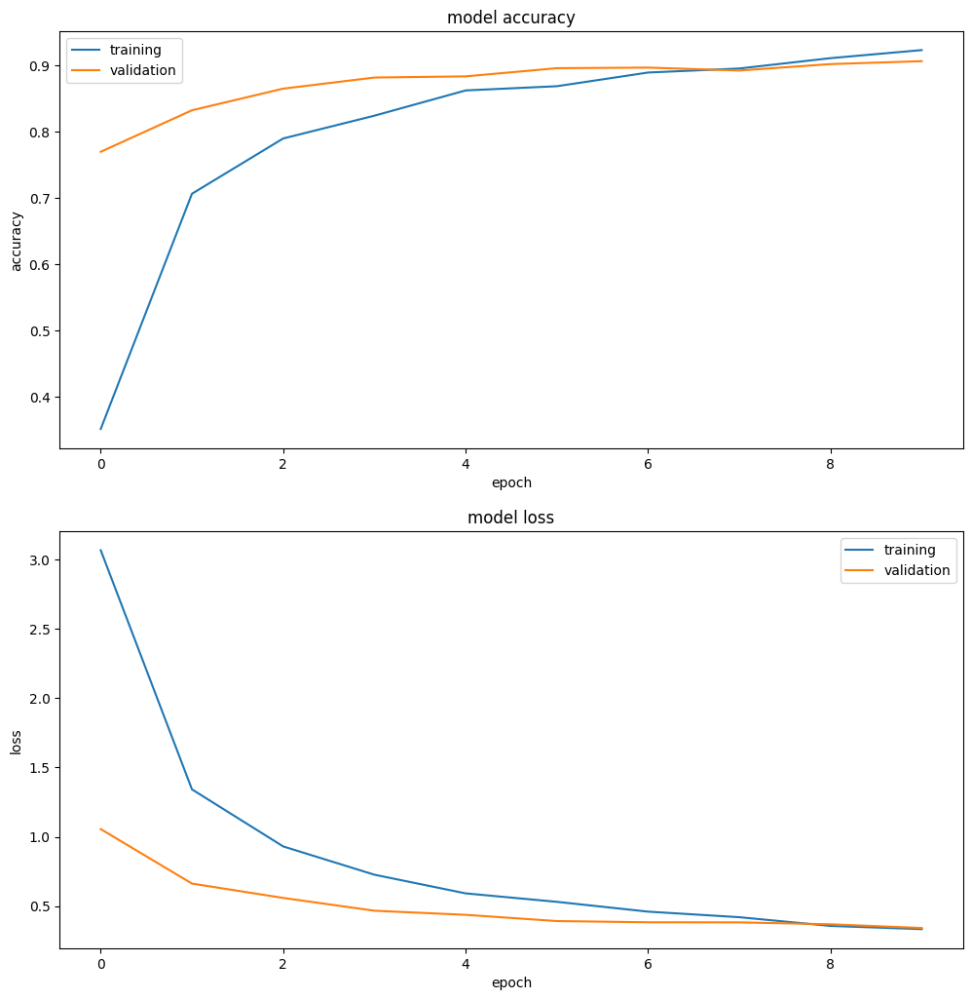

In [110]:
plt.subplots(figsize=(10,10))
plt.tight_layout()

display_training_curves(bm_history.history['accuracy'], bm_history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(bm_history.history['loss'], bm_history.history['val_loss'], 'loss', 212)


In [36]:
#function for the evaluation report.
import seaborn as sns
def evaluate_and_plot_confusion_matrix(model, generator):
    # Generate predictions
    y_pred = model.predict(generator)

    # Convert predictions to class labels
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Convert true labels to class labels
    y_true_classes = generator.classes

    # Get class labels
    class_labels = list(generator.class_indices.keys())

    # Calculate confusion matrix
    cm = confusion_matrix(y_true_classes, y_pred_classes)

    # Plot confusion matrix
    plt.figure(figsize=(20, 25))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    # Display classification report
    print('\nClassification Report:\n', classification_report(y_true_classes, y_pred_classes, target_names=class_labels))


33/33 [==============================] - 7s 113ms/step


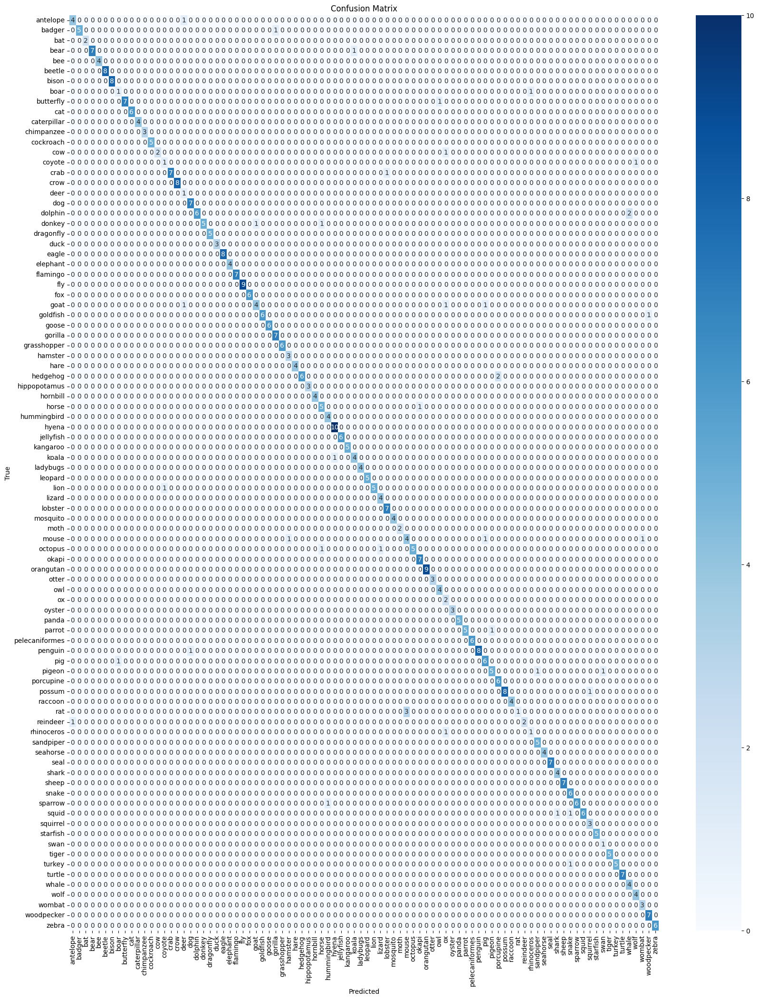


Classification Report:
                 precision    recall  f1-score   support

      antelope       0.80      0.80      0.80         5
        badger       1.00      0.83      0.91         6
           bat       1.00      1.00      1.00         2
          bear       1.00      0.88      0.93         8
           bee       1.00      1.00      1.00         4
        beetle       1.00      1.00      1.00         8
         bison       1.00      1.00      1.00         8
          boar       0.50      0.50      0.50         2
     butterfly       1.00      0.88      0.93         8
           cat       1.00      1.00      1.00         6
   caterpillar       1.00      1.00      1.00         4
    chimpanzee       1.00      1.00      1.00         3
     cockroach       1.00      1.00      1.00         5
           cow       1.00      0.67      0.80         3
        coyote       0.50      0.50      0.50         2
          crab       1.00      0.88      0.93         8
          crow       1

In [111]:
#plotting confusion matrix and calssifiaction report of  model
evaluate_and_plot_confusion_matrix(model, test_images)

In [62]:
#defining the function to get the predicted label

def flower_title(label, prediction):
  # Both prediction (probabilities) and label (one-hot) are arrays with one item per class.
  class_idx = np.argmax(label, axis=-1)
  prediction_idx = np.argmax(prediction, axis=-1)
  if class_idx == prediction_idx:
    return f'{CLASSES[prediction_idx]} [correct]', 'green'
  else:
    return f'{CLASSES[prediction_idx]} [incorrect, should be {CLASSES[class_idx]}]', 'red'

def get_titles(images, labels, model):
  predictions = model.predict(images)
  titles, colors = [], []
  for label, prediction in zip(classes, predictions):
    title, color = flower_title(label, prediction)
    titles.append(title)
    colors.append(color)
  return titles, colors

1/1 [==============================] - 0s 52ms/step


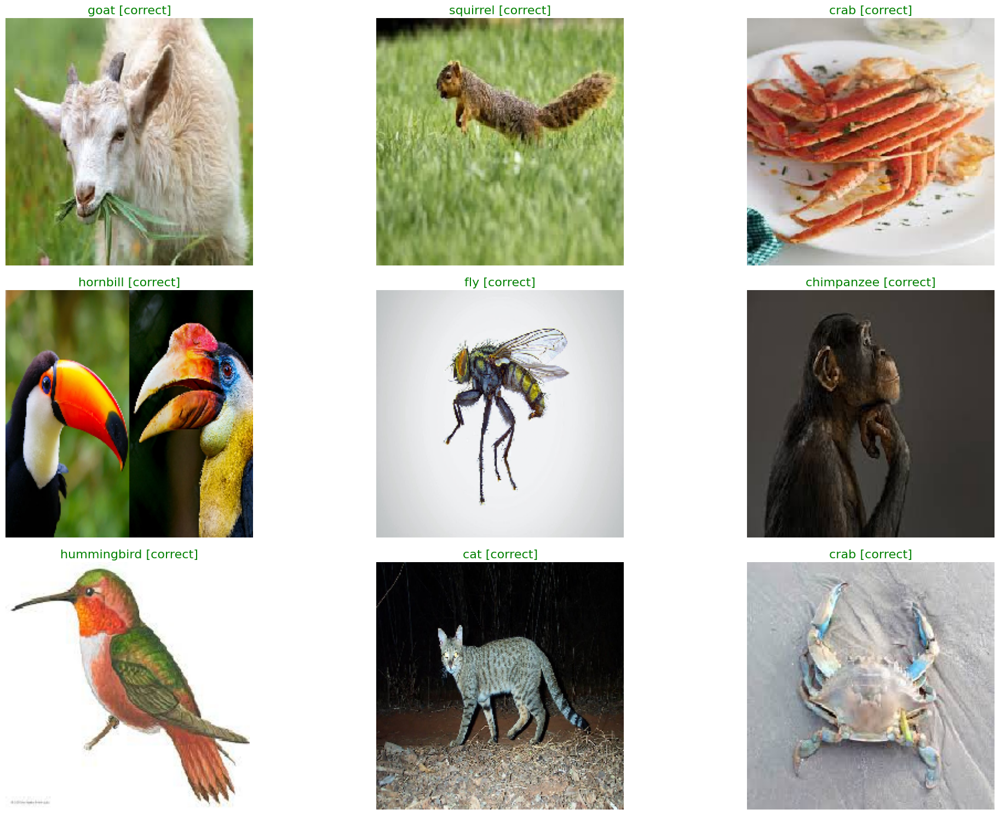

In [113]:
# displaying the predicted data of vgg19_model.
images, classes = next(test_images)
titles, colors = get_titles(images, classes, model)
display_nine_flowers(images, titles, colors)